In [1]:
# environment: torch-gpu

import warnings
warnings.filterwarnings('ignore')

import torchvision
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor, Lambda
import torchvision.transforms as T
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torchvision.utils import Image
from torchvision.io import read_image

import pandas
import numpy
import numpy as np
import matplotlib.pyplot as plt

import torch.nn.functional as F
import torch.utils.data as data_utils
from sklearn.model_selection import train_test_split
import glob

In [2]:
import pandas
treatments = pandas.read_csv('treatments.txt', sep='\t')
print(treatments.shape)
treatments.head()

(240, 2)


,well,guide
0,C03,non-targeting_00999
1,C05,LAMP1
2,C07,LMNB2
3,C09,DYRK1A
4,C11,PICALM


In [4]:
treatments.guide.value_counts()

guide
non-targeting_00999    8
LAMP1                  8
LMNB2                  8
DYRK1A                 8
PICALM                 8
SOD1                   8
MESDC1                 8
DNM1L                  8
BECN1                  8
CKAP5_1                8
MFN2_2                 8
non-targeting_03731    8
non-targeting_00177    8
non-targeting_02443    8
non-targeting_01460    8
MFN2_1                 8
ILK                    8
PSEN1                  8
PINK1                  8
ATP13A2                8
CKAP5_2                8
non-targeting_01706    8
non-targeting_02621    8
non-targeting_00095    8
non-targeting_02160    8
non-targeting_02396    8
GNAO1                  8
non-targeting_03526    8
non-targeting_03677    8
non-targeting_02845    8
Name: count, dtype: int64

In [3]:
def load_npy(p):
    return numpy.load(p)[:,:,:3].astype(numpy.uint8)

In [4]:
def load_tif(p):
    return plt.imread(p)

In [6]:
# individual cells:

# tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])#, transforms.RandomHorizontalFlip(), transforms.RandomRotation(90)])
# tf = transforms.Compose([transforms.ToTensor(), transforms.ConvertImageDtype(torch.float32), transforms.Resize(224), transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])
tf = transforms.Compose([transforms.ToTensor(), transforms.ConvertImageDtype(torch.float32), transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])

# dataset = datasets.ImageFolder('images/', transform = tf)
dataset = datasets.DatasetFolder('processed/plate1/cells/', transform = tf, loader=load_npy, extensions='npy')

# dataset = datasets.DatasetFolder('processed/plate1/tf_cells/', transform = tf, loader=load_tif, extensions='tif')

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [0.7, 0.15, 0.15])

# train_dataset = transforms.ConvertImageDtype(torch.float32)(train_dataset)
# train_dataset = transforms.ToPILImage()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomHorizontalFlip()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomRotation(90)(train_dataset)

print(len(train_dataset), len(val_dataset), len(test_dataset))

94540 20258 20258


In [7]:
dataset.class_to_idx

{'ATP13A2': 0,
 'BECN1': 1,
 'CKAP5_1': 2,
 'CKAP5_2': 3,
 'DNM1L': 4,
 'DYRK1A': 5,
 'GNAO1': 6,
 'ILK': 7,
 'LAMP1': 8,
 'LMNB2': 9,
 'MESDC1': 10,
 'MFN2_1': 11,
 'MFN2_2': 12,
 'PICALM': 13,
 'PINK1': 14,
 'PSEN1': 15,
 'SOD1': 16,
 'non-targeting_00095': 17,
 'non-targeting_00177': 18,
 'non-targeting_00999': 19,
 'non-targeting_01460': 20,
 'non-targeting_01706': 21,
 'non-targeting_02160': 22,
 'non-targeting_02396': 23,
 'non-targeting_02443': 24,
 'non-targeting_02621': 25,
 'non-targeting_02845': 26,
 'non-targeting_03526': 27,
 'non-targeting_03677': 28,
 'non-targeting_03731': 29}

In [10]:
ls processed/plate1/images

ATP13A2/  LAMP1/                non-targeting_01460/  non-targeting_03677/
BECN1/    LMNB2/                non-targeting_01706/  non-targeting_03731/
CKAP5_1/  MESDC1/               non-targeting_02160/  PICALM/
CKAP5_2/  MFN2_1/               non-targeting_02396/  PINK1/
DNM1L/    MFN2_2/               non-targeting_02443/  PSEN1/
DYRK1A/   non-targeting_00095/  non-targeting_02621/  SOD1/
GNAO1/    non-targeting_00177/  non-targeting_02845/
ILK/      non-targeting_00999/  non-targeting_03526/


In [42]:
# full images:

# tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])#, transforms.RandomHorizontalFlip(), transforms.RandomRotation(90)])
tf = transforms.Compose([transforms.ToTensor(), transforms.ConvertImageDtype(torch.float32), transforms.Resize(224), transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])
# tf = transforms.Compose([transforms.ToTensor()])#, transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

# dataset = datasets.ImageFolder('images/', transform = tf)
# dataset = datasets.DatasetFolder('cells/', transform = tf, loader=load_npy, extensions='npy')
dataset = datasets.DatasetFolder('processed/plate1/images/', transform = tf, loader=load_npy, extensions='npy')
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [0.7, 0.15, 0.15])

# train_dataset = transforms.ConvertImageDtype(torch.float32)(train_dataset)
# train_dataset = transforms.ToPILImage()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomHorizontalFlip()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomRotation(90)(train_dataset)

print(len(train_dataset), len(val_dataset), len(test_dataset))

627 134 134


In [11]:
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=True)

print(len(trainloader), len(testloader), len(valloader))

1478 317 317


In [12]:
d = dict()
d_rev = dict()
for x, y in dataset.class_to_idx.items():
    d[y] = x
    d_rev[x] = y
len(d)

30

In [14]:
next(iter(trainloader))[0].shape

torch.Size([64, 3, 120, 120])

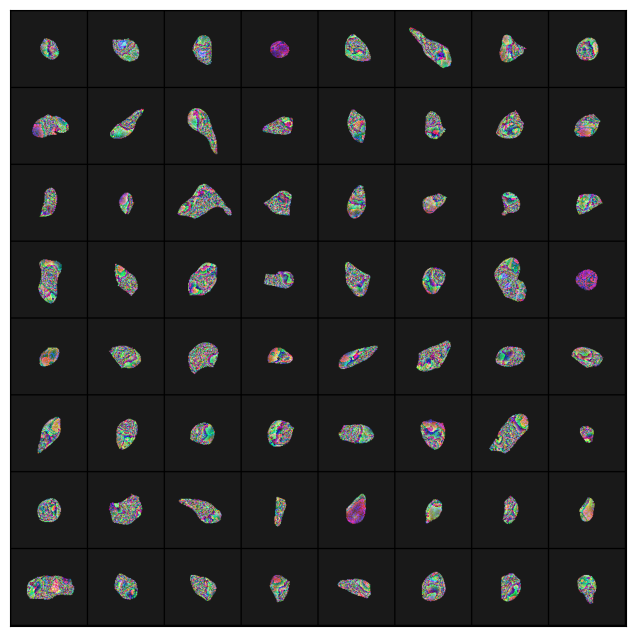

In [26]:
# show batch of images:

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid((images.detach()[:nmax].type(torch.uint8)), nrow=8).permute(1, 2, 0))
    # ax.imshow(make_grid((images[:nmax]), nrow=8).permute(1, 2, 0))
    # ax.imshow(numpy.transpose((images[:nmax]/1+.000001).type(torch.uint8), (1, 2, 0)))
    
def show_batch(dl, nmax=64):
    for images, l in dl:
        show_images((images/.001), nmax)
        break

show_batch(trainloader)

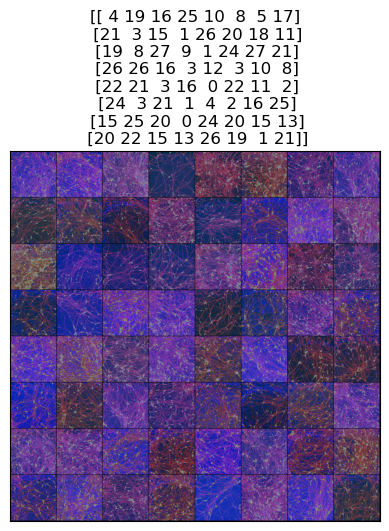

In [52]:
import torchvision.transforms.functional as VisionF
for batch in trainloader:
    img1, label = batch
    break

img_grid = make_grid(img1, normalize=True)


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
        labels = [label]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = VisionF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img)*7)
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        axs[0, i].set_title(label.view(8,8).numpy())#.tolist(), fontweight='bold', fontsize=20)

show(img_grid)

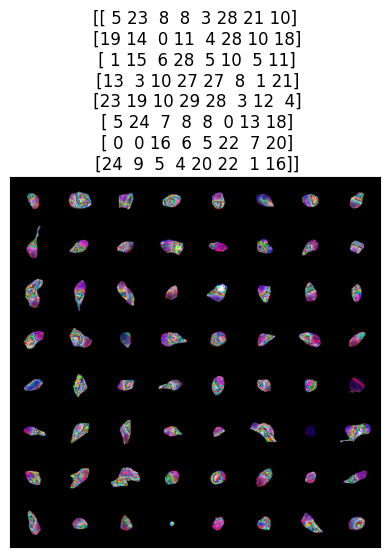

In [27]:
import torchvision.transforms.functional as VisionF
for batch in trainloader:
    img1, label = batch
    break

img_grid = make_grid(img1, normalize=True)


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
        labels = [label]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = VisionF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img)*3)
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        axs[0, i].set_title(label.view(8,8).numpy())#.tolist(), fontweight='bold', fontsize=20)

show(img_grid)

#### DeepYeast model from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5427497/:

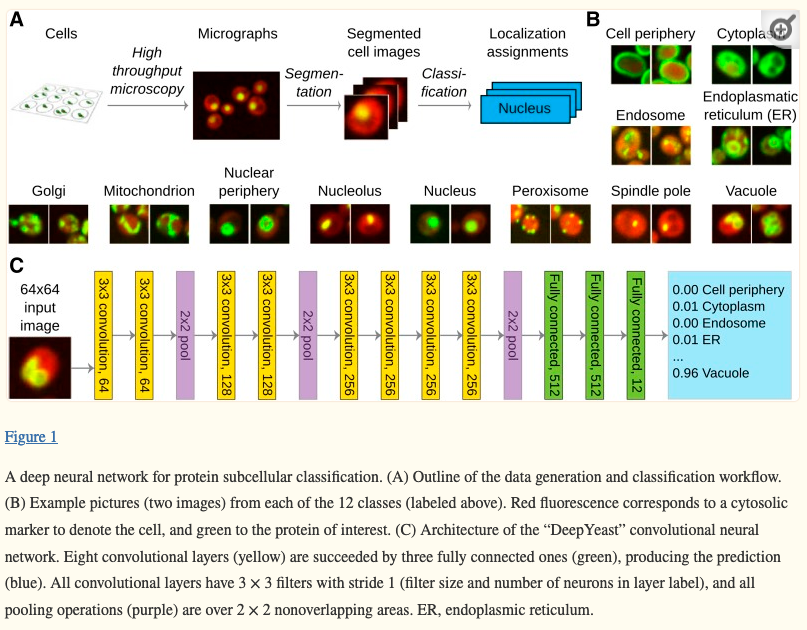

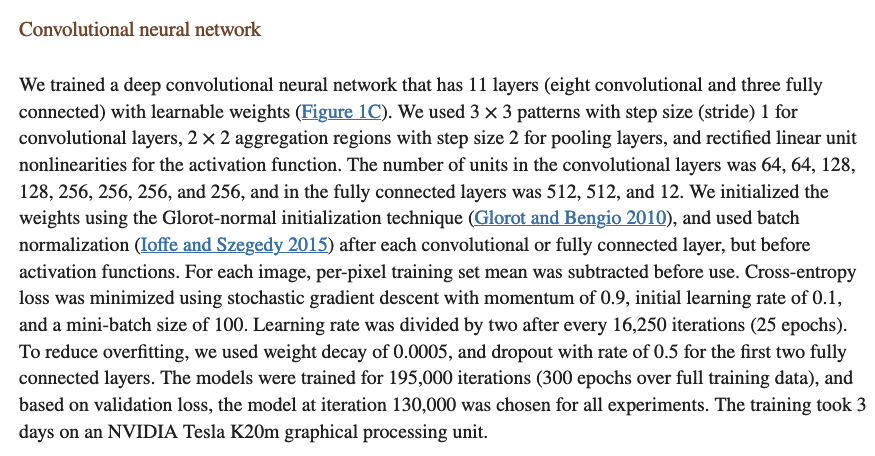

In [18]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [28]:
# define the CNN architecture
class DeepYeast(nn.Module):
    def __init__(self):
        super(DeepYeast, self).__init__()
        # convolutional layer (sees 32x32x3 image tensor) #3x120x120 - original - would end up at 15 after 3 maxpools
        self.conv1 = nn.Conv2d(3, 64, 3, padding=1)
        # self.batch1 = nn.BatchNorm2d(64)
        self.act1 = nn.ReLU()
        
        # convolutional layer (sees 16x16x16 tensor) #16x60x60
        self.conv2 = nn.Conv2d(64, 64, 3, padding=1)
        # self.batch2 = nn.BatchNorm2d(64)
        self.act2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(2,2)
        
        # convolutional layer (sees 8x8x32 tensor) #32x30x30
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        # self.batch3 = nn.BatchNorm2d(128)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(128, 128, 3, padding=1)
        # self.batch4 = nn.BatchNorm2d(128)
        self.act4 = nn.ReLU()
        self.pool4 = nn.MaxPool2d(2,2)
        
        # conv layer (sees 128x28x28)?
        self.conv5 = nn.Conv2d(128, 256, 3, padding=1)
        # self.batch5 = nn.BatchNorm2d(256)
        self.act5 = nn.ReLU()
        
        self.conv6 = nn.Conv2d(256, 256, 3, padding=1)
        # self.batch6 = nn.BatchNorm2d(256)
        self.act6 = nn.ReLU()

        
        self.conv7 = nn.Conv2d(256, 256, 3, padding=1)
        # self.batch7 = nn.BatchNorm2d(256)
        self.act7 = nn.ReLU()

    
        self.conv8 = nn.Conv2d(256, 256, 3, padding=1)
        # self.batch8 = nn.BatchNorm2d(256)
        self.act8 = nn.ReLU()
        self.pool8 = nn.MaxPool2d(2,2)

        self.flat = nn.Flatten()

        # linear layer (64 * 4 * 4 -> 500) #256x14x14
        self.fc1 = nn.Linear(256 * 15 * 15, 512) # --> single cells (120x120 input)
        # self.batch9 = nn.BatchNorm1d(512)
        # self.fc1 = nn.Linear(256 * 28 * 28, 512)  # --> full images (resized to 224x224)
        self.act9 = nn.ReLU()
        self.drop1 = nn.Dropout(.5)

        self.fc2 = nn.Linear(512, 512)
        # self.batch10 = nn.BatchNorm1d(512)
        self.act10 = nn.ReLU()
        self.drop2 = nn.Dropout(.5)

        self.fc3 = nn.Linear(512, len(d))


    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        # x = self.pool(F.relu(self.conv1(x)))
        # x = self.pool(F.relu(self.conv2(x)))
        # x = self.pool(F.relu(self.conv3(x)))

        x = self.act1(self.conv1(x))
        x = self.pool2(self.act2(self.conv2(x)))

        x = self.act3(self.conv3(x))
        x = self.pool4(self.act4(self.conv4(x)))

        x = self.act5(self.conv5(x))
        x = self.act6(self.conv6(x))
        x = self.act7(self.conv7(x))
        x = self.pool8(self.act8(self.conv8(x)))
        
        x = self.flat(x)

        x = self.act9(self.fc1(x))
        x = self.drop1(x)
        x = self.act10(self.fc2(x))
        x = self.drop2(x)

        x = self.fc3(x)

# adding in batchnorm:
        # x = self.act1(self.batch1(self.conv1(x)))
        # x = self.pool2(self.batch2(self.act2(self.conv2(x))))

        # x = self.act3(self.conv3(x))
        # x = self.pool4(self.act4(self.conv4(x)))

        # x = self.act5(self.conv5(x))
        # x = self.act6(self.conv6(x))
        # x = self.act7(self.conv7(x))
        # x = self.pool8(self.act8(self.conv8(x)))
        
        # x = self.flat(x)

        # x = self.act9(self.batch9(self.fc1(x)))
        # x = self.drop1(x)
        # x = self.act10(self.batch10(self.fc2(x)))
        # x = self.drop2(x)

        # x = self.fc3(x)

        
        return x
        
# #         x = self.pool(F.relu(self.conv4(x)))
#         # flatten image input
# #         x = x.view(-1, 64 * 4 * 4)
#         x = torch.flatten(x, 1) # flatten all dimensions except batch
#         # add dropout layer
#         x = self.dropout(x)
#         # add 1st hidden layer, with relu activation function
#         x = F.relu(self.fc1(x))
#         # add dropout layer
#         x = self.dropout(x)
#         # add 2nd hidden layer, with relu activation function
#         x = self.fc2(x)
#         # x = self.dropout(x)
#         x = self.fc3(x)
# #         x = self.dropout(x)
# #         x = self.fc4(x)
#         return x

# create a complete CNN
model = DeepYeast().to('cuda')
model

DeepYeast(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act1): ReLU()
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act3): ReLU()
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act4): ReLU()
  (pool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act5): ReLU()
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act6): ReLU()
  (conv7): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act7): ReLU()
  (conv8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act8): ReLU()
  (pool8): MaxPool2d(kernel_size=2, stride=2, padding=0

In [29]:
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()#weight=weights)

# specify optimizer
from torch import optim
optimizer = optim.SGD(model.parameters(), lr=0.01)#, momentum=.9, weight_decay=.0005)
# optimizer = optim.Adam(model.parameters(), lr=0.01)

In [30]:
# # use all available GPUs:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # model = CreateModel()

# # model= nn.DataParallel(model)
# model.to(device)

In [31]:
# DeepYeast training

# single cells, 30 labels - all separate vectors - plate 1:

train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print ('CUDA is not available. Training on CPU...')
else: print('CUDA is available. Training on GPU...')

n_epochs = 100

valid_loss_min = numpy.Inf # track change in validation loss

train_losses, test_losses = [], []

for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for data, target in trainloader:
#         # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    for data, target in valloader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # update average validation loss 
        valid_loss += loss.item()*data.size(0)
    
    # calculate average losses
    train_loss = train_loss/len(trainloader.sampler)
    valid_loss = valid_loss/len(valloader.sampler)
    
    train_losses.append(train_loss)
    test_losses.append(valid_loss)
        
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        valid_loss))
        torch.save(model.state_dict(), '30label_DeepYeast_model_plate1.pt')
        valid_loss_min = valid_loss

CUDA is available. Training on GPU...


KeyboardInterrupt: 

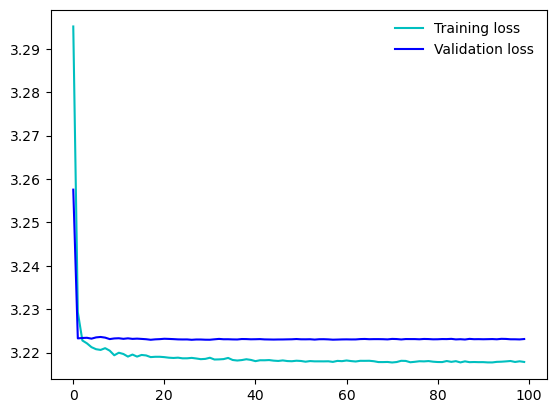

In [37]:
plt.plot(train_losses, label='Training loss', color='c')
plt.plot(test_losses, label='Validation loss', color='b')
plt.legend(frameon=False)

In [38]:
model.load_state_dict(torch.load('30label_DeepYeast_model_plate1.pt'))

<All keys matched successfully>

In [39]:

# initialize lists to monitor test loss and accuracy
num_classes = len(d)
test_loss = 0.0
class_correct = list(0. for i in range(num_classes))
class_total = list(0. for i in range(num_classes))

model.cuda().eval() # prep model for *evaluation*
# model.cpu().eval()

for data, target in testloader:
    data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)
    # compare predictions to true label
    correct = numpy.squeeze(pred.eq(target.data.view_as(pred)))
    # calculate test accuracy for each object class
    for i in range(len(data)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# calculate and print avg test loss
test_loss = test_loss/len(testloader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(num_classes):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            d[i], 100 * class_correct[i] / class_total[i],
            class_correct[i], class_total[i]))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * numpy.sum(class_correct) / numpy.sum(class_total),
    numpy.sum(class_correct), numpy.sum(class_total)))

## deepyeast plate1 100 epochs:

Test Loss: 3.222080

Test Accuracy of ATP13A2:  0% ( 0/347)
Test Accuracy of BECN1:  0% ( 0/512)
Test Accuracy of CKAP5_1:  0% ( 0/292)
Test Accuracy of CKAP5_2:  0% ( 0/301)
Test Accuracy of DNM1L:  0% ( 0/317)
Test Accuracy of DYRK1A:  0% ( 0/555)
Test Accuracy of GNAO1:  0% ( 0/336)
Test Accuracy of   ILK:  0% ( 0/366)
Test Accuracy of LAMP1:  0% ( 0/613)
Test Accuracy of LMNB2:  0% ( 0/164)
Test Accuracy of MESDC1:  0% ( 0/449)
Test Accuracy of MFN2_1:  0% ( 0/177)
Test Accuracy of MFN2_2:  0% ( 0/257)
Test Accuracy of PICALM:  0% ( 0/544)
Test Accuracy of PINK1:  0% ( 0/134)
Test Accuracy of PSEN1:  0% ( 0/300)
Test Accuracy of  SOD1: 100% (703/703)
Test Accuracy of non-targeting_00095:  0% ( 0/318)
Test Accuracy of non-targeting_00177:  0% ( 0/321)
Test Accuracy of non-targeting_00999:  0% ( 0/612)
Test Accuracy of non-targeting_01460:  0% ( 0/194)
Test Accuracy of non-targeting_01706:  0% ( 0/341)
Test Accuracy of non-targeting_02160:  0% ( 0/167)
Test Accuracy of non-targeting_

In [32]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# turn off autograd for testing evaluation
with torch.no_grad():
# set the model in evaluation mode
    model.to('cpu').eval()
# initialize a list to store our predictions
    preds = []
    ytest = []
# loop over the test set
    for (x, y) in testloader:
        # make the predictions and add them to the list
#         x = x.view(x.shape[0], -1)
        # x, y = x.cuda(), y.cuda()
        pred = model(x)
        preds.extend(pred.argmax(axis=1).cpu().numpy())
        ytest.extend(list(y.numpy()))
# generate a classification report

print(classification_report(numpy.array(ytest), numpy.array(preds)))

conf_mtx = confusion_matrix(y_true = ytest, y_pred = preds, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:5])
vis.plot(cmap='Blues', xticks_rotation=45)

## previous experiment - w/ chemical perturbations

Test Loss: 0.394789

Test Accuracy of  DMSO: 81% (467/570)
Test Accuracy of Rotenone: 83% (500/599)

Test Accuracy (Overall): 82% (967/1169)




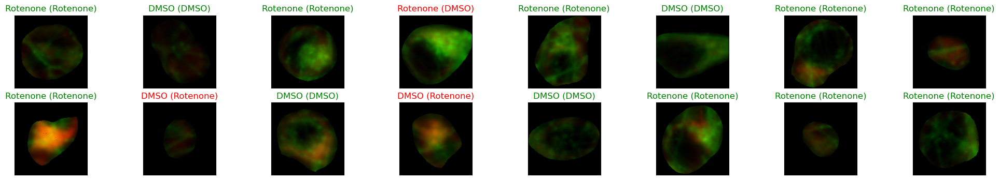

In [17]:
# 2 labels 100 epochs:

d2 = {0:'DMSO', 1:'Rotenone'}

num_classes = 2
test_loss = 0.0
class_correct = list(0. for i in range(num_classes))
class_total = list(0. for i in range(num_classes))

model.cuda().eval()

for data, target in testloader:
    data, target = data.cuda(), target.cuda()
    output = model(data)
    loss = criterion(output, target)
    test_loss += loss.item()*data.size(0)
    _, pred = torch.max(output, 1)
    correct = numpy.squeeze(pred.eq(target.data.view_as(pred)))
    for i in range(len(data)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

test_loss = test_loss/len(testloader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(num_classes):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            d2[i], 100 * class_correct[i] / class_total[i],
            class_correct[i], class_total[i]))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * numpy.sum(class_correct) / numpy.sum(class_total),
    numpy.sum(class_correct), numpy.sum(class_total)))

print('\n')

import numpy as np
import torchvision.transforms.functional as VisionF

images, labels = next(iter(testloader))
images, labels = images.cuda(), labels.cuda()

output = model(images)

# convert output probabilities to predicted class
_, preds = torch.max(output, 1)
# prep images for display
images = images.cpu().numpy()

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(16):
    ax = fig.add_subplot(2, 8, idx+1, xticks=[], yticks=[])
    # ax.imshow(np.transpose((images[idx]).astype(np.uint8), (1, 2, 0)))
    ax.imshow(np.transpose((images[idx]/1+.000001).astype(np.uint8), (1, 2, 0))) # /2+.5 - un-normalizes
    ax.set_title("{} ({})".format(d2[preds[idx].item()], d2[labels[idx].item()]),
                 color=("green" if preds[idx]==labels[idx] else "red"))

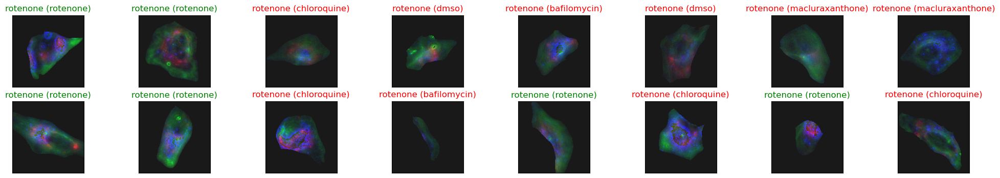

In [44]:
# 5 labels:

import numpy as np
import torchvision.transforms.functional as VisionF
# obtain one batch of test images
dataiter = iter(testloader)
images, labels = next(dataiter)
images, labels = images.cuda(), labels.cuda()

# get sample outputs
# images = images.view(images.shape[0], -1)
# output = model(images.view(images.shape[0], -1))
output = model(images)

# convert output probabilities to predicted class
_, preds = torch.max(output, 1)
# prep images for display
images = images.cpu().numpy()

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(16):
    ax = fig.add_subplot(2, 8, idx+1, xticks=[], yticks=[])
    # ax.imshow(np.transpose((images[idx]).astype(np.uint8), (1, 2, 0)))
    ax.imshow(np.transpose((images[idx]/.001).astype(np.uint8), (1, 2, 0))) # /2+.5 - un-normalizes
    ax.set_title("{} ({})".format(d[preds[idx].item()], d[labels[idx].item()]),
                 color=("green" if preds[idx]==labels[idx] else "red"))

In [33]:

# initialize lists to monitor test loss and accuracy
num_classes = 5
test_loss = 0.0
class_correct = list(0. for i in range(num_classes))
class_total = list(0. for i in range(num_classes))

model.cuda().eval() # prep model for *evaluation*
# model.cpu().eval()

for data, target in testloader:
    data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)
    # compare predictions to true label
    correct = numpy.squeeze(pred.eq(target.data.view_as(pred)))
    # calculate test accuracy for each object class
    for i in range(len(data)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# calculate and print avg test loss
test_loss = test_loss/len(testloader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(num_classes):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            d[i], 100 * class_correct[i] / class_total[i],
            class_correct[i], class_total[i]))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * numpy.sum(class_correct) / numpy.sum(class_total),
    numpy.sum(class_correct), numpy.sum(class_total)))

Test Loss: 1.006830

Test Accuracy of  DMSO: 65% (355/539)
Test Accuracy of Bafilomycin: 18% (116/642)
Test Accuracy of Chloroquine: 21% (140/643)
Test Accuracy of Macluraxanthone: 100% (392/392)
Test Accuracy of Rotenone: 80% (508/628)

Test Accuracy (Overall): 53% (1511/2844)


              precision    recall  f1-score   support

           0       0.39      0.39      0.39       549
           1       0.37      0.37      0.37       621
           2       0.46      0.34      0.39       702
           3       0.96      0.98      0.97       380
           4       0.65      0.84      0.73       592

    accuracy                           0.55      2844
   macro avg       0.57      0.58      0.57      2844
weighted avg       0.53      0.55      0.54      2844



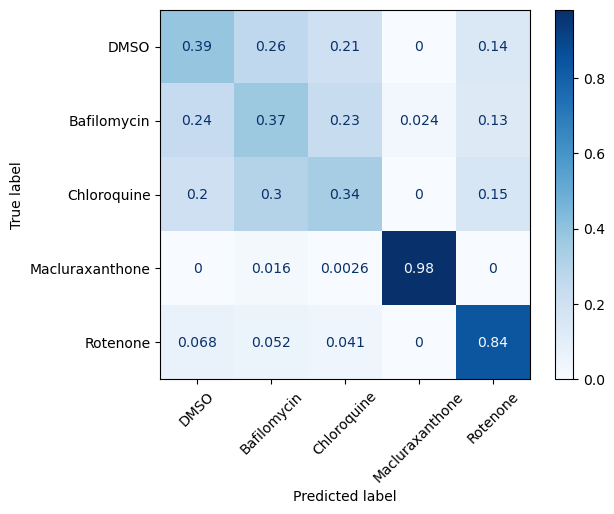

In [140]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# turn off autograd for testing evaluation
with torch.no_grad():
# set the model in evaluation mode
    model.to('cpu').eval()
# initialize a list to store our predictions
    preds = []
    ytest = []
# loop over the test set
    for (x, y) in testloader:
        # make the predictions and add them to the list
#         x = x.view(x.shape[0], -1)
        # x, y = x.cuda(), y.cuda()
        pred = model(x)
        preds.extend(pred.argmax(axis=1).cpu().numpy())
        ytest.extend(list(y.numpy()))
# generate a classification report

print(classification_report(numpy.array(ytest), numpy.array(preds)))

conf_mtx = confusion_matrix(y_true = ytest, y_pred = preds, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:5])
vis.plot(cmap='Blues', xticks_rotation=45)

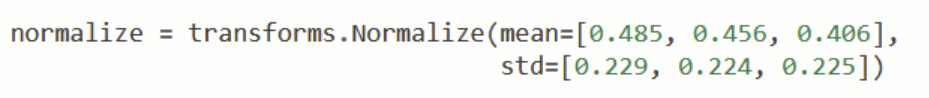

In [40]:
# training on full images:

# tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])#, transforms.RandomHorizontalFlip(), transforms.RandomRotation(90)])
tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

def load_npy(p):
    return numpy.load(p)[:,:,:3]

def load_tif(p):
    import matplotlib.pyplot as plt
    return plt.imread(p)

dataset = datasets.DatasetFolder('processed/plate1/images/', transform = tf, loader=load_npy, extensions='npy')
# dataset = datasets.DatasetFolder('processed/plate6/tf_images/', transform = tf, loader=load_tif, extensions='tif')
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [0.7, 0.15, 0.15])

# train_dataset = transforms.ConvertImageDtype(torch.float32)(train_dataset)
# train_dataset = transforms.ToPILImage()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomHorizontalFlip()(torch.as_tensor(train_dataset))
# train_dataset = transforms.RandomRotation(90)(train_dataset)

print(len(train_dataset), len(val_dataset), len(test_dataset))

602 129 128


In [39]:
# # VGG16 on single cells:

# # tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])#, transforms.RandomHorizontalFlip(), transforms.RandomRotation(90)])
# tf = transforms.Compose([transforms.ToTensor(), transforms.Resize(224), transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

# def load_npy(p):
#     return numpy.load(p)[:,:,:3]

# dataset = datasets.DatasetFolder('cells/', transform = tf, loader=load_npy, extensions='npy')
# train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [0.7, 0.15, 0.15])

# # train_dataset = transforms.ConvertImageDtype(torch.float32)(train_dataset)
# # train_dataset = transforms.ToPILImage()(torch.as_tensor(train_dataset))
# # train_dataset = transforms.RandomHorizontalFlip()(torch.as_tensor(train_dataset))
# # train_dataset = transforms.RandomRotation(90)(train_dataset)

# print(len(train_dataset), len(val_dataset), len(test_dataset))

In [42]:
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=True)

In [43]:
dataset.class_to_idx

{'ATP13A2': 0,
 'BECN1': 1,
 'CKAP5_1': 2,
 'CKAP5_2': 3,
 'DNM1L': 4,
 'DYRK1A': 5,
 'GNAO1': 6,
 'ILK': 7,
 'LAMP1': 8,
 'LMNB2': 9,
 'MESDC1': 10,
 'MFN2_1': 11,
 'MFN2_2': 12,
 'PICALM': 13,
 'PINK1': 14,
 'PSEN1': 15,
 'SOD1': 16,
 'non-targeting_00095': 17,
 'non-targeting_00177': 18,
 'non-targeting_00999': 19,
 'non-targeting_01460': 20,
 'non-targeting_01706': 21,
 'non-targeting_02160': 22,
 'non-targeting_02396': 23,
 'non-targeting_02443': 24,
 'non-targeting_02621': 25,
 'non-targeting_02845': 26,
 'non-targeting_03526': 27,
 'non-targeting_03677': 28,
 'non-targeting_03731': 29}

In [5]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [27]:
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer
from torch import optim
optimizer = optim.SGD(model.parameters(), lr=0.01)

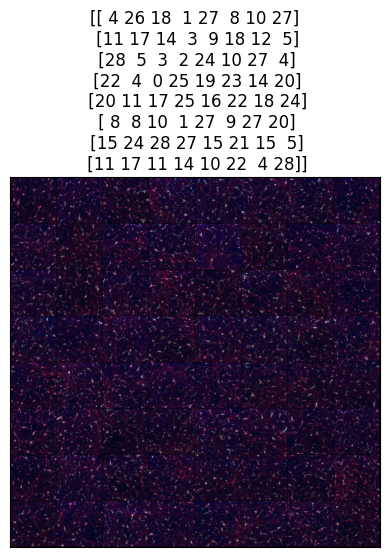

In [44]:
import torchvision.transforms.functional as VisionF
for batch in trainloader:
    img1, label = batch
    break

img_grid = make_grid(img1, normalize=True)


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
        labels = [label]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = VisionF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        axs[0, i].set_title(label.view(8,8).numpy())#.tolist(), fontweight='bold', fontsize=20)

show(img_grid)

# Transfer learning
### https://github.com/udacity/deep-learning-v2-pytorch/blob/master/intro-to-pytorch/Part%208%20-%20Transfer%20Learning%20(Solution).ipynb
#### & 
### https://github.com/udacity/deep-learning-v2-pytorch/blob/master/transfer-learning/Transfer_Learning_Solution.ipynb

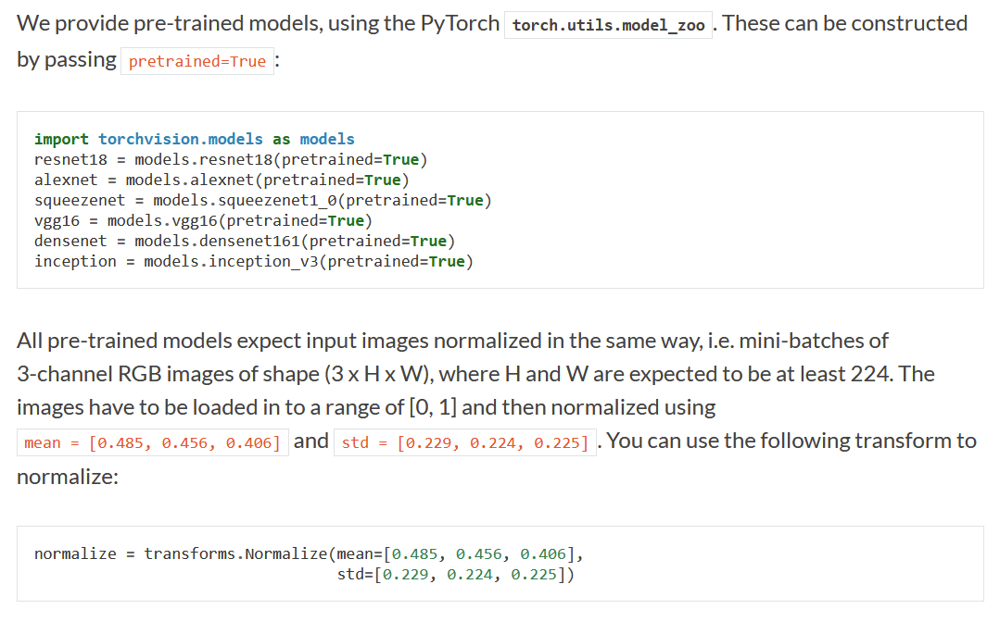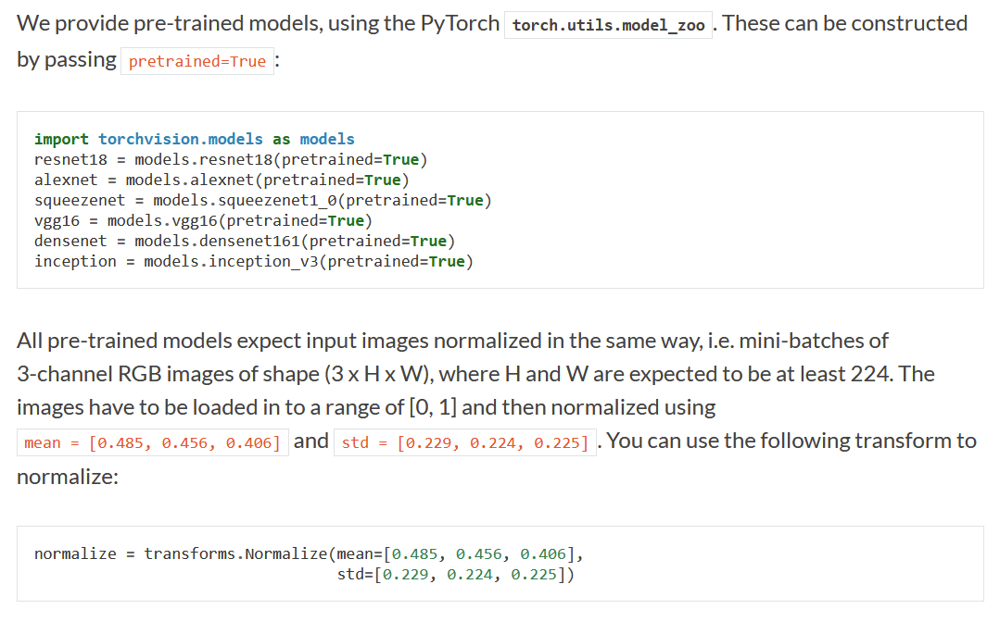

In [45]:
from torchvision import models
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

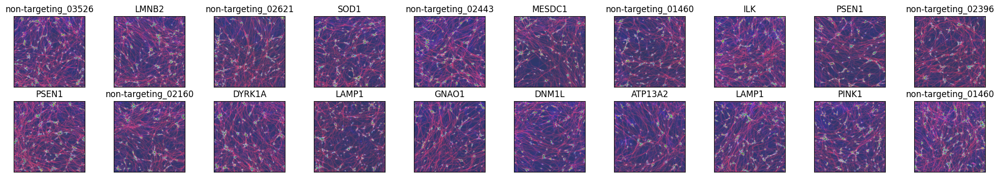

In [49]:
# visualize some sample data:
# obtain one batch of training images
dataiter = iter(trainloader)
images, labels = next(dataiter)
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose((images[idx]/.01).astype(np.uint8), (1, 2, 0)))
    # plt.imshow(np.transpose(np.asarray(images[idx]), (1,2,0)))
    # ax.imshow(np.squeeze(images[idx].astype(np.uint8)), cmap='gray')
    ax.set_title(d[labels[idx].item()])

In [50]:
# dataiter = iter(trainloader)
# images, labels = next(dataiter)
# images = images.numpy() # convert images to numpy for display

# # plot the images in the batch, along with the corresponding labels
# fig = plt.figure(figsize=(20, 20))
# for idx in np.arange(64):
#     ax = fig.add_subplot(8, 8, idx+1, xticks=[], yticks=[])
#     plt.imshow(np.transpose((images[idx]/.002).astype(np.uint8), (1, 2, 0)))
#     # plt.imshow(np.transpose(np.asarray(images[idx]), (1,2,0)))
#     # ax.imshow(np.squeeze(images[idx].astype(np.uint8)), cmap='gray')
#     ax.set_title(d[labels[idx].item()])

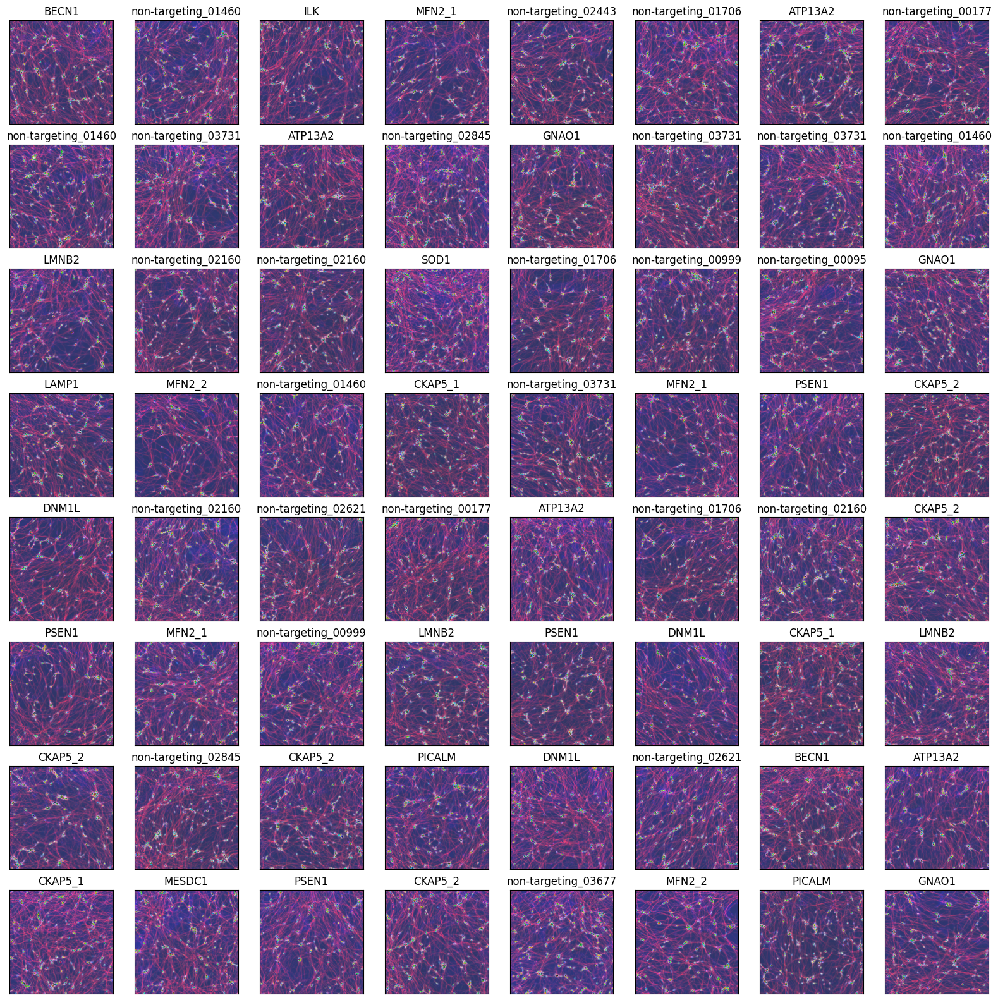

In [51]:
dataiter = iter(trainloader)
images, labels = next(dataiter)
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 20))
for idx in np.arange(64):
    ax = fig.add_subplot(8, 8, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose((images[idx]/.01).astype(np.uint8), (1, 2, 0)))
    # plt.imshow(np.transpose(np.asarray(images[idx]), (1,2,0)))
    # ax.imshow(np.squeeze(images[idx].astype(np.uint8)), cmap='gray')
    ax.set_title(d[labels[idx].item()])

# VGG16 model:

In [52]:
vgg16 = models.vgg16(pretrained=True)
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [53]:
print(vgg16.classifier[6].in_features) 
print(vgg16.classifier[6].out_features) 

4096
1000


In [54]:
# Freeze training for all "features" layers
for param in vgg16.features.parameters():
    param.requires_grad = False

In [55]:
train_on_gpu = True

In [57]:
# final classifier layer:
import torch.nn as nn
n_inputs = vgg16.classifier[6].in_features
n_classes = len(dataset.class_to_idx)
# add last linear layer (4096 -> 30)
# new layers automatically have requires_grad=True

# from flowers notebook:
last_layer = nn.Linear(n_inputs, n_classes)

vgg16.classifier[6] = last_layer

# from part 8 intro-to-pytorch:
# from collections import  OrderedDict
# classifier = nn.Sequential(OrderedDict([('fc1', nn.Linear(4096, 500)), 'relu', nn.ReLu()), ('fc2', nn.Linear(500, n_classes)), 'output', nn.LogSoftmax(dim=1))]))

if train_on_gpu:
    vgg16.cuda()

print(vgg16.classifier[6].out_features)

30


In [58]:
# loss function & optimizer:
from torch import optim
criterion = nn.CrossEntropyLoss()#weight=weights)
optimizer = optim.SGD(vgg16.classifier.parameters(), lr = .01)

In [59]:
## VGG on full images - all guides separate (30):

# 20241217 - plate1

valid_loss_min = numpy.Inf

n_epochs = 100

trainloss = []
valloss = []

for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    
    ###################
    # train the model #
    ###################
    # model by default is set to train
    vgg16.train()
    for data, target in trainloader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = vgg16(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        trainloss.append(train_loss)

    ######################    
    # validate the model #
    ######################    
    test_loss = 0
    accuracy = 0
    vgg16.eval()
    # with torch.no_grad():
    for inputs, labels in valloader:
        inputs, labels = inputs.cuda(), labels.cuda()
        test_output = vgg16.forward(inputs)
        test_loss += criterion(test_output, labels)
        valloss.append(test_loss.item())
        top_p, top_class = test_output.topk(1, dim=1)
        equals = top_class == labels.view(*top_class.shape)
        accuracy += torch.mean(equals.type(torch.FloatTensor)).item()
    

    # print('epoch %d train loss: %.10f' % (epoch, train_loss))
    print('epoch %d loss: %.10f test loss: %.5f test accuracy: %.3f' % (epoch, train_loss, test_loss, accuracy/len(valloader)))
    # train_loss = 0
    if test_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        test_loss))
        torch.save(vgg16.state_dict(), '30label_VGG16_model_plate1_full_imgs.pt')
        valid_loss_min = test_loss

epoch 1 loss: 34.9355502129 test loss: 10.57407 test accuracy: 0.005
Validation loss decreased (inf --> 10.574070).  Saving model ...
epoch 2 loss: 34.3709101677 test loss: 10.65724 test accuracy: 0.016
epoch 3 loss: 34.2535426617 test loss: 10.00663 test accuracy: 0.016
Validation loss decreased (10.574070 --> 10.006632).  Saving model ...
epoch 4 loss: 33.8638620377 test loss: 10.21137 test accuracy: 0.016
epoch 5 loss: 33.4983935356 test loss: 10.48457 test accuracy: 0.021
epoch 6 loss: 33.3947510719 test loss: 10.16584 test accuracy: 0.026
epoch 7 loss: 33.2631831169 test loss: 9.97947 test accuracy: 0.026
Validation loss decreased (10.006632 --> 9.979472).  Saving model ...
epoch 8 loss: 33.1913559437 test loss: 10.12465 test accuracy: 0.036
epoch 9 loss: 32.7887454033 test loss: 10.14794 test accuracy: 0.031
epoch 10 loss: 32.8210544586 test loss: 10.11222 test accuracy: 0.042
epoch 11 loss: 32.5618715286 test loss: 10.00035 test accuracy: 0.042
epoch 12 loss: 32.4842300415 test 

In [28]:
## VGG on cells - 30 guides - balanced classes:

# 20240705 - plate6 dataset - subsetted cells - all 30 guides

valid_loss_min = numpy.Inf

n_epochs = 100

trainloss = []
valloss = []

for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    
    ###################
    # train the model #
    ###################
    # model by default is set to train
    vgg16.train()
    for data, target in trainloader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = vgg16(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        trainloss.append(train_loss)

    ######################    
    # validate the model #
    ######################    
    test_loss = 0
    accuracy = 0
    vgg16.eval()
    # with torch.no_grad():
    for inputs, labels in valloader:
        inputs, labels = inputs.cuda(), labels.cuda()
        test_output = vgg16.forward(inputs)
        test_loss += criterion(test_output, labels)
        valloss.append(test_loss.item())
        top_p, top_class = test_output.topk(1, dim=1)
        equals = top_class == labels.view(*top_class.shape)
        accuracy += torch.mean(equals.type(torch.FloatTensor)).item()
    

    # print('epoch %d train loss: %.10f' % (epoch, train_loss))
    print('epoch %d loss: %.10f test loss: %.5f test accuracy: %.3f' % (epoch, train_loss, test_loss, accuracy/len(valloader)))
    # train_loss = 0
    if test_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        test_loss))
        torch.save(vgg16.state_dict(), '30label_VGG16_model_plate5_cells.pt')
        valid_loss_min = test_loss

epoch 1 loss: 5559.5085895061 test loss: 1185.51575 test accuracy: 0.057
Validation loss decreased (inf --> 1185.515747).  Saving model ...
epoch 2 loss: 5524.1482343674 test loss: 1183.07776 test accuracy: 0.059
Validation loss decreased (1185.515747 --> 1183.077759).  Saving model ...
epoch 3 loss: 5507.8252682686 test loss: 1181.13831 test accuracy: 0.063
Validation loss decreased (1183.077759 --> 1181.138306).  Saving model ...
epoch 4 loss: 5494.4308047295 test loss: 1180.18079 test accuracy: 0.061
Validation loss decreased (1181.138306 --> 1180.180786).  Saving model ...
epoch 5 loss: 5482.8125021458 test loss: 1178.79504 test accuracy: 0.062
Validation loss decreased (1180.180786 --> 1178.795044).  Saving model ...
epoch 6 loss: 5470.7476470470 test loss: 1178.04541 test accuracy: 0.064
Validation loss decreased (1178.795044 --> 1178.045410).  Saving model ...
epoch 7 loss: 5458.2401180267 test loss: 1176.60474 test accuracy: 0.064
Validation loss decreased (1178.045410 --> 1176

KeyboardInterrupt: 

In [60]:
vgg16.load_state_dict(torch.load('30label_VGG16_model_plate1_full_imgs.pt'))

<All keys matched successfully>

In [61]:
d = dict()
for x, y in dataset.class_to_idx.items():
    d[y] = x

num_classes = len(d)
test_loss = 0.0
class_correct = list(0. for i in range(num_classes))
class_total = list(0. for i in range(num_classes))

vgg16.cuda().eval() # prep model for *evaluation*
# model.cpu().eval()

for data, target in testloader:
    data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = vgg16(data)
    # calculate the loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)
    # compare predictions to true label
    correct = numpy.squeeze(pred.eq(target.data.view_as(pred)))
    # calculate test accuracy for each object class
    for i in range(len(data)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# calculate and print avg test loss
test_loss = test_loss/len(testloader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(num_classes):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            d[i], 100 * class_correct[i] / class_total[i],
            class_correct[i], class_total[i]))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * numpy.sum(class_correct) / numpy.sum(class_total),
    numpy.sum(class_correct), numpy.sum(class_total)))


### plate1 VGG on full images:

Test Loss: 4.165771

Test Accuracy of ATP13A2:  0% ( 0/ 3)
Test Accuracy of BECN1:  0% ( 0/ 3)
Test Accuracy of CKAP5_1:  0% ( 0/ 3)
Test Accuracy of CKAP5_2: 16% ( 1/ 6)
Test Accuracy of DNM1L: 50% ( 1/ 2)
Test Accuracy of DYRK1A:  0% ( 0/ 3)
Test Accuracy of GNAO1:  0% ( 0/ 5)
Test Accuracy of   ILK:  0% ( 0/ 4)
Test Accuracy of LAMP1:  0% ( 0/ 4)
Test Accuracy of LMNB2:  0% ( 0/ 4)
Test Accuracy of MESDC1: 50% ( 1/ 2)
Test Accuracy of MFN2_1:  0% ( 0/ 5)
Test Accuracy of MFN2_2: 20% ( 1/ 5)
Test Accuracy of PICALM: 50% ( 1/ 2)
Test Accuracy of PINK1:  0% ( 0/ 4)
Test Accuracy of PSEN1:  0% ( 0/ 3)
Test Accuracy of  SOD1:  0% ( 0/ 5)
Test Accuracy of non-targeting_00095:  0% ( 0/ 5)
Test Accuracy of non-targeting_00177:  0% ( 0/ 6)
Test Accuracy of non-targeting_00999:  0% ( 0/ 6)
Test Accuracy of non-targeting_01460:  0% ( 0/ 3)
Test Accuracy of non-targeting_01706: 25% ( 1/ 4)
Test Accuracy of non-targeting_02160:  0% ( 0/ 4)
Test Accuracy of non-targeting_02396:  0% ( 0/ 6)
Test A

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         3
           3       0.04      0.17      0.07         6
           4       1.00      0.50      0.67         2
           5       0.00      0.00      0.00         3
           6       0.00      0.00      0.00         5
           7       0.00      0.00      0.00         4
           8       0.00      0.00      0.00         4
           9       0.00      0.00      0.00         4
          10       0.50      0.50      0.50         2
          11       0.00      0.00      0.00         5
          12       0.20      0.20      0.20         5
          13       0.17      0.50      0.25         2
          14       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         5
          17       0.00    

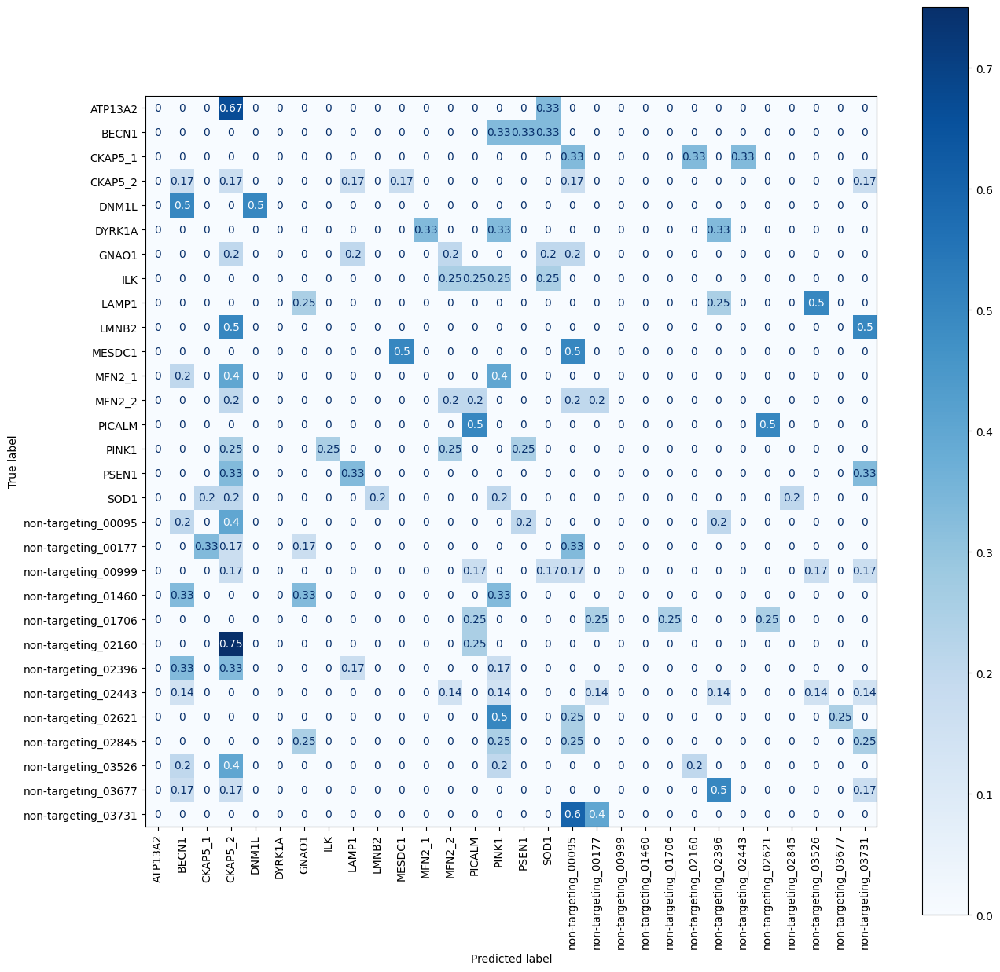

In [62]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# turn off autograd for testing evaluation
with torch.no_grad():
# set the model in evaluation mode
    vgg16.to('cpu').eval()
# initialize a list to store our predictions
    preds = []
    ytest = []
# loop over the test set
    for (x, y) in testloader:
        # make the predictions and add them to the list
#         x = x.view(x.shape[0], -1)
        # x, y = x.cuda(), y.cuda()
        pred = vgg16(x)
        preds.extend(pred.argmax(axis=1).cpu().numpy())
        ytest.extend(list(y.numpy()))
# generate a classification report

print(classification_report(numpy.array(ytest), numpy.array(preds)))

fig, ax = plt.subplots(figsize=(15,15))
conf_mtx = confusion_matrix(y_true = ytest, y_pred = preds, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:len(d)])
vis.plot(ax=ax, cmap='Blues', xticks_rotation=90)

## transformers

In [73]:
cd plate1

/home/ymoshfegh/1014e/20241217/processed/plate1


In [65]:
mkdir tf_cells

In [67]:
treatments.guide.unique()

array(['non-targeting_00999', 'LAMP1', 'LMNB2', 'DYRK1A', 'PICALM',
       'SOD1', 'MESDC1', 'DNM1L', 'BECN1', 'CKAP5_1', 'MFN2_2',
       'non-targeting_03731', 'non-targeting_00177',
       'non-targeting_02443', 'non-targeting_01460', 'MFN2_1', 'ILK',
       'PSEN1', 'PINK1', 'ATP13A2', 'CKAP5_2', 'non-targeting_01706',
       'non-targeting_02621', 'non-targeting_00095',
       'non-targeting_02160', 'non-targeting_02396', 'GNAO1',
       'non-targeting_03526', 'non-targeting_03677',
       'non-targeting_02845'], dtype=object)

In [68]:
cd tf_cells

/home/ymoshfegh/1014e/20241217/processed/plate1/tf_cells


In [69]:
import os
for x in treatments.guide.unique():
    os.system('mkdir ' + x)

In [70]:
cd ../../

/home/ymoshfegh/1014e/20241217/processed


In [60]:
# pip install scikit-image
# Successfully installed imageio-2.36.0 lazy-loader-0.4 scikit-image-0.24.0 tifffile-2024.9.20

In [47]:
import skimage
skimage.io.imsave('test.tif', testimg)

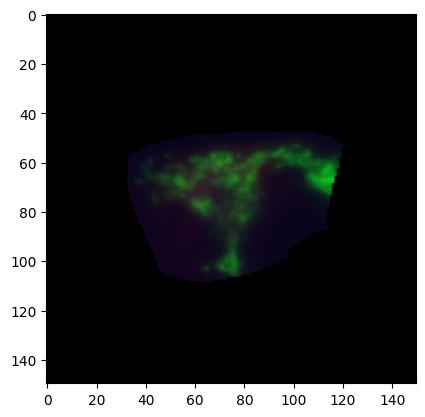

In [48]:
tif = plt.imread('test.tif')
plt.imshow(tif)

In [49]:
(testimg == tif).all()

True

In [74]:
cd cells

/home/ymoshfegh/1014e/20241217/processed/plate1/cells


In [77]:
import warnings
warnings.filterwarnings('ignore')
import skimage
import numpy
import os
import glob
for tm in treatments.guide.unique():
# for tm in g:
    print(tm)
    for i in glob.glob(tm + '/*.npy'):
        img = numpy.load(i)[:,:,:3].astype('uint8')
        # print(i[-10:-4])
        # print(img.shape)
        # name = str(i[-10:-4])
        name = i.split('/')[-1][:-4]
        # print(name)
        # w = name[:3]
        # folder = treatments[treatments.well==w]['guide'].item()
        # print(name, w, folder)
        skimage.io.imsave('../tf_cells/' + tm + '/' + name + '.tif', img)

non-targeting_00999
LAMP1
LMNB2
DYRK1A
PICALM
SOD1
MESDC1
DNM1L
BECN1
CKAP5_1
MFN2_2
non-targeting_03731
non-targeting_00177
non-targeting_02443
non-targeting_01460
MFN2_1
ILK
PSEN1
PINK1
ATP13A2
CKAP5_2
non-targeting_01706
non-targeting_02621
non-targeting_00095
non-targeting_02160
non-targeting_02396
GNAO1
non-targeting_03526
non-targeting_03677
non-targeting_02845


In [78]:
cd ../../../

/home/ymoshfegh/1014e/20241217/processed


In [4]:
pwd

'/home/ymoshfegh/1014e/20241217'

In [5]:
import transformers
from transformers import pipeline

2025-01-29 11:10:59.211196: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-29 11:10:59.247509: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-29 11:10:59.247554: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-29 11:10:59.248866: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-29 11:10:59.255440: I tensorflow/core/platform/cpu_feature_guar

In [6]:
clf = pipeline('image-classification', device='cuda')#, use_fast=True)

No model was supplied, defaulted to google/vit-base-patch16-224 and revision 5dca96d (https://huggingface.co/google/vit-base-patch16-224).
Using a pipeline without specifying a model name and revision in production is not recommended.
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


In [7]:
from datasets import load_dataset
dataset = load_dataset("imagefolder", data_dir="processed/plate1/tf_cells/")
dataset

Resolving data files:   0%|          | 0/135056 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 135056
    })
})

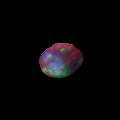

In [11]:
import random
r = random.randint(0,len(dataset['train']))
dataset['train'][r]['image']

In [13]:
dataset['train'][r]

{'image': <PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=120x120>,
 'label': 15}

In [14]:
dataset['train'].features

{'image': Image(mode=None, decode=True, id=None),
 'label': ClassLabel(names=['ATP13A2', 'BECN1', 'CKAP5_1', 'CKAP5_2', 'DNM1L', 'DYRK1A', 'GNAO1', 'ILK', 'LAMP1', 'LMNB2', 'MESDC1', 'MFN2_1', 'MFN2_2', 'PICALM', 'PINK1', 'PSEN1', 'SOD1', 'non-targeting_00095', 'non-targeting_00177', 'non-targeting_00999', 'non-targeting_01460', 'non-targeting_01706', 'non-targeting_02160', 'non-targeting_02396', 'non-targeting_02443', 'non-targeting_02621', 'non-targeting_02845', 'non-targeting_03526', 'non-targeting_03677', 'non-targeting_03731'], id=None)}

In [15]:
# adding in file info to be able to track exact cells:
file_names = [x for x in dataset['train'].info.download_checksums.keys()]
dataset['train'] = dataset['train'].add_column("file", file_names)
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'file'],
        num_rows: 135056
    })
})

In [16]:
dataset['train'][r]['file']

'/home/ymoshfegh/1014e/20241217/processed/plate1/tf_cells/PSEN1/N05_s1_144.tif'

In [17]:
# this didn't work:
# dataset = load_dataset("imagefolder", data_dir="processed/plate1/tf_cells/", return_file_names= True)

In [18]:
d = dict()
d_rev = dict()

for x, y in enumerate (dataset['train'].features['label'].names):
    d[x] = y
    d_rev[y] = x
print(d)
print(d_rev)

{0: 'ATP13A2', 1: 'BECN1', 2: 'CKAP5_1', 3: 'CKAP5_2', 4: 'DNM1L', 5: 'DYRK1A', 6: 'GNAO1', 7: 'ILK', 8: 'LAMP1', 9: 'LMNB2', 10: 'MESDC1', 11: 'MFN2_1', 12: 'MFN2_2', 13: 'PICALM', 14: 'PINK1', 15: 'PSEN1', 16: 'SOD1', 17: 'non-targeting_00095', 18: 'non-targeting_00177', 19: 'non-targeting_00999', 20: 'non-targeting_01460', 21: 'non-targeting_01706', 22: 'non-targeting_02160', 23: 'non-targeting_02396', 24: 'non-targeting_02443', 25: 'non-targeting_02621', 26: 'non-targeting_02845', 27: 'non-targeting_03526', 28: 'non-targeting_03677', 29: 'non-targeting_03731'}
{'ATP13A2': 0, 'BECN1': 1, 'CKAP5_1': 2, 'CKAP5_2': 3, 'DNM1L': 4, 'DYRK1A': 5, 'GNAO1': 6, 'ILK': 7, 'LAMP1': 8, 'LMNB2': 9, 'MESDC1': 10, 'MFN2_1': 11, 'MFN2_2': 12, 'PICALM': 13, 'PINK1': 14, 'PSEN1': 15, 'SOD1': 16, 'non-targeting_00095': 17, 'non-targeting_00177': 18, 'non-targeting_00999': 19, 'non-targeting_01460': 20, 'non-targeting_01706': 21, 'non-targeting_02160': 22, 'non-targeting_02396': 23, 'non-targeting_02443

In [19]:
# load pretrained model:

# baseViT

checkpoint = "google/vit-base-patch16-224-in21k"

# checkpoint = 'facebook/dinov2-base'
from transformers import AutoModelForImageClassification, TrainingArguments, Trainer
from transformers import DefaultDataCollator
from transformers import AutoImageProcessor
image_processor = AutoImageProcessor.from_pretrained(checkpoint, use_fast=True)

In [20]:
# accuracy evaluation helper function:
import evaluate
import numpy
accuracy = evaluate.load("accuracy")
def compute_metrics(eval_pred):
   predictions, labels = eval_pred
   predictions = numpy.argmax(predictions, axis=1)

   return accuracy.compute(predictions=predictions,
                           references=labels)

In [21]:
model = AutoModelForImageClassification.from_pretrained(
   checkpoint,
   num_labels=len(d),
   id2label=d,
   label2id=d_rev,)
model

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

In [22]:
image_processor.size

{'height': 224, 'width': 224}

In [23]:
from torchvision.transforms import (
    CenterCrop,
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    Resize,
    ToTensor,
)

normalize = Normalize(mean=image_processor.image_mean, std=image_processor.image_std)
if "height" in image_processor.size:
    size = (image_processor.size["height"], image_processor.size["width"])
    crop_size = size
    max_size = None
elif "shortest_edge" in image_processor.size:
    size = image_processor.size["shortest_edge"]
    crop_size = (size, size)
    max_size = image_processor.size.get("longest_edge")

train_transforms = Compose(
        [
            RandomResizedCrop(crop_size),
            # Resize(size),
            RandomHorizontalFlip(),
            ToTensor(),
            normalize,
        ]
    )

val_transforms = Compose(
        [
            Resize(size),
            CenterCrop(crop_size),
            ToTensor(),
            normalize,
        ]
    )

def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    example_batch["pixel_values"] = [
        train_transforms(image.convert("RGB")) for image in example_batch["image"]
    ]
    return example_batch

def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    example_batch["pixel_values"] = [val_transforms(image.convert("RGB")) for image in example_batch["image"]]
    return example_batch

In [24]:
# split up training into training + validation
split1 = dataset["train"].train_test_split(test_size=0.15)
split2 = split1['train'].train_test_split(test_size=.176)
train_ds = split2['train']
val_ds = split1['test']
test_ds = split2['test']
print(train_ds, val_ds, test_ds)

Dataset({
    features: ['image', 'label', 'file'],
    num_rows: 94592
}) Dataset({
    features: ['image', 'label', 'file'],
    num_rows: 20259
}) Dataset({
    features: ['image', 'label', 'file'],
    num_rows: 20205
})


In [26]:
train_ds.set_transform(preprocess_train)
val_ds.set_transform(preprocess_val)
test_ds.set_transform(preprocess_val)

test_ds[0]

{'image': <PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=120x120>,
 'label': 1,
 'file': '/home/ymoshfegh/1014e/20241217/processed/plate1/tf_cells/BECN1/L12_s4_61.tif',
 'pixel_values': tensor([[[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.]],
 
         [[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.]],
 
         [[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1.,

In [29]:
test_ds[0]['pixel_values'].mean()

tensor(-0.8550)

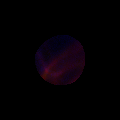

In [31]:
test_ds[-10]['image']

In [24]:
# this might have messed it up - using environment from lgr2

# pip install transformers[torch]
# Successfully installed accelerate-1.1.0

In [33]:
# pip install accelerate -U

In [32]:
training_args = TrainingArguments(
	output_dir="./transformer/plate1/baseViT/",
	remove_unused_columns=False,
	eval_strategy="epoch",
	save_strategy="epoch",
	learning_rate=5e-5,
	per_device_train_batch_size=64,
	gradient_accumulation_steps=4,
	per_device_eval_batch_size=64,
	num_train_epochs=100,
	warmup_ratio=0.1,
	logging_steps=10,
	load_best_model_at_end=True,
    # save_steps=1,
	metric_for_best_model="accuracy")

In [33]:
import torch

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["label"] for example in examples])
    # files = torch.tensor([example['file'] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}#, 'files':files}

In [34]:
trainer = Trainer(
    model,
    training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    tokenizer=image_processor,
    compute_metrics=compute_metrics,
    data_collator=collate_fn,)

In [35]:
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

Epoch,Training Loss,Validation Loss,Accuracy
0,3.396700,3.393997,0.047315
1,3.369500,3.364543,0.064242
2,3.327200,3.309477,0.077605
4,3.264100,3.264740,0.090275
5,3.257100,3.246870,0.095125
6,3.232000,3.237458,0.098243
8,3.215400,3.214434,0.103093
9,3.200700,3.208732,0.103836
10,3.179300,3.197695,0.105419
12,3.163100,3.189261,0.108043


KeyboardInterrupt: 

In [36]:
metrics = trainer.evaluate()
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

***** eval metrics *****
  eval_accuracy =  0.106
  eval_loss     = 3.2006


In [39]:
model.save_pretrained('transformer/plate1/base_ViT/')

In [36]:
import os
from transformers.trainer_callback import TrainerState

save_dir = "transformer/plate1/base_ViT/"
ckpt = os.listdir(save_dir)
ckpt = [x for x in ckpt if '-' in x]
ckpt = sorted(ckpt, key=lambda x: int(x.split('-')[1]))
last_ckpt = ckpt[-1]

state = TrainerState.load_from_json(f"{save_dir}/{last_ckpt}/trainer_state.json")

print(state.best_model_checkpoint) # your best ckpoint.

./transformer/plate2/base_ViT/checkpoint-18369


In [ ]:
model = AutoModelForImageClassification.from_pretrained(
   checkpoint,
   num_labels=len(d),
   id2label=d,
   label2id=d_rev,)

              precision    recall  f1-score   support

           0       0.07      0.11      0.09       709
           1       0.08      0.07      0.07       788
           2       0.14      0.32      0.20       495
           3       0.08      0.29      0.12       702
           4       0.55      0.81      0.66       800
           5       0.06      0.03      0.04       706
           6       0.04      0.01      0.02       569
           7       0.14      0.01      0.01       598
           8       0.09      0.15      0.11       608
           9       0.06      0.06      0.06       686
          10       0.09      0.01      0.02       592
          11       0.07      0.09      0.08       739
          12       0.21      0.18      0.20       349
          13       0.08      0.15      0.11       746
          14       0.06      0.05      0.06       619
          15       0.07      0.03      0.04       732
          16       0.13      0.20      0.16       560
          17       0.08    

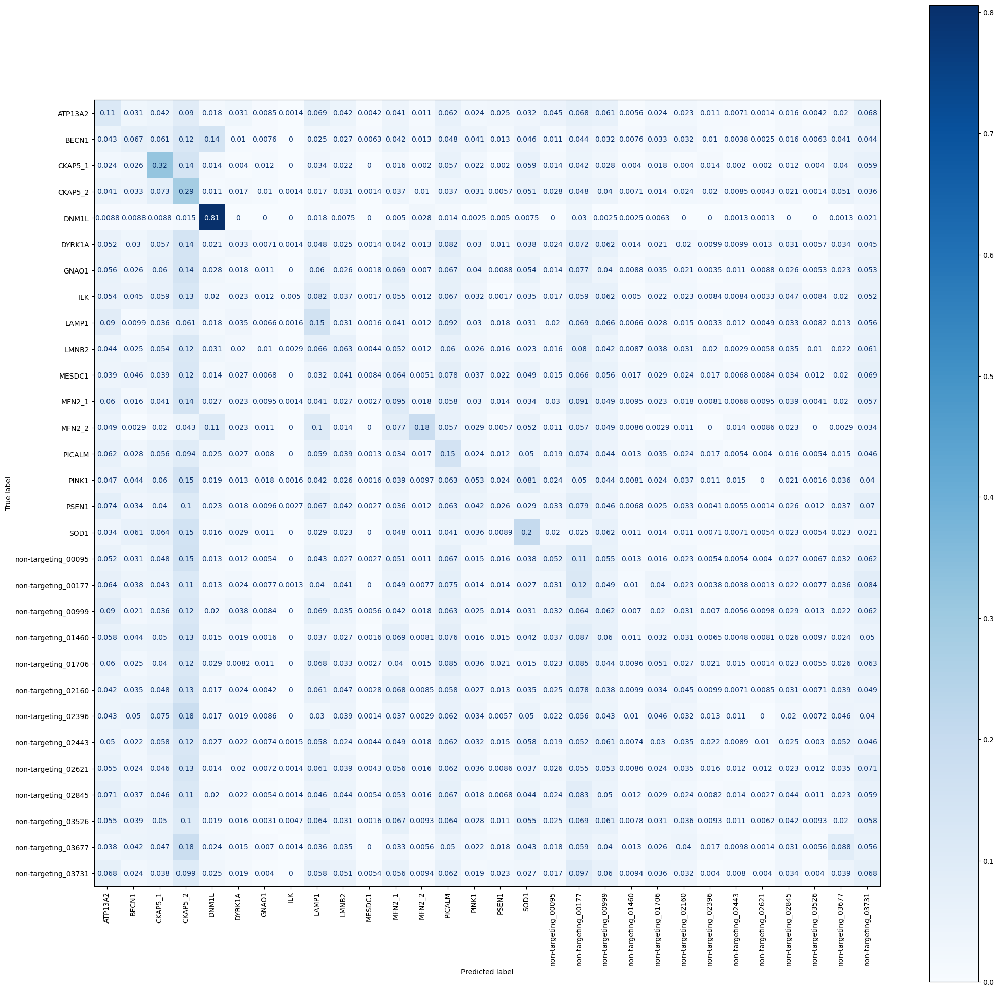

In [38]:
pred = []
ref = []
outs = []
imgs = []
for i in test_ds:
    image = i['image']
    # image = image.to('CUDA')
    # encoding = i['pixel_values']
    # prepare image for the model
    encoding = image_processor(image.convert("RGB"), return_tensors="pt").to('cuda')
    # print(encoding.pixel_values.shape)
    # forward pass
    with torch.no_grad():
        # outputs = model.cpu()(**encoding)
        outputs = model.to('cuda')(**encoding)
        logits = outputs.logits
    # print(model.config.id2label[logits.argmax(-1).item()])
    pred.append(logits.argmax(-1).item())
    ref.append(i['label'])
    outs.append(outputs)
    imgs.append(i['file'])
    # print(len(pred))
# print('accuracy: ', str(pred.count(d_rev[tm])/len(pred)))
from sklearn.metrics import classification_report
print(classification_report(numpy.array(ref), numpy.array(pred)))

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,25))
conf_mtx = confusion_matrix(y_true = ref, y_pred = pred, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:len(d)])
vis.plot(ax=ax, cmap='Blues', xticks_rotation=90)

### older runs:

In [23]:
# test_ds = test_ds.to('cuda')
pred = []
ref = []
for i in test_ds:
    image = i['image']
    # image = image.to('CUDA')
    # encoding = i['pixel_values']
    # prepare image for the model
    encoding = image_processor(image.convert("RGB"), return_tensors="pt").to('cuda')
    # print(encoding.pixel_values.shape)
    # forward pass
    with torch.no_grad():
        # outputs = model.cpu()(**encoding)
        outputs = model.to('cuda')(**encoding)
        logits = outputs.logits
    # print(model.config.id2label[logits.argmax(-1).item()])
    pred.append(logits.argmax(-1).item())
    ref.append(i['label'])
    # print(len(pred))
# print('accuracy: ', str(pred.count(d_rev[tm])/len(pred)))
from sklearn.metrics import classification_report
print(classification_report(numpy.array(ref), numpy.array(pred)))

              precision    recall  f1-score   support

           0       0.28      0.31      0.29       547
           1       0.17      0.14      0.15       509
           2       0.22      0.23      0.22       517
           3       0.23      0.16      0.19       534
           4       0.34      0.34      0.34       800
           5       0.36      0.35      0.35       745
           6       0.22      0.23      0.22       592
           7       0.24      0.31      0.28       632
           8       0.29      0.38      0.33       690
           9       0.29      0.28      0.28       599
          10       0.28      0.23      0.25       654
          11       0.20      0.22      0.21       683
          12       0.28      0.32      0.30       597
          13       0.44      0.39      0.41       783
          14       0.50      0.47      0.49       733
          15       0.29      0.25      0.27       574
          16       0.20      0.18      0.19       534
          17       0.31    

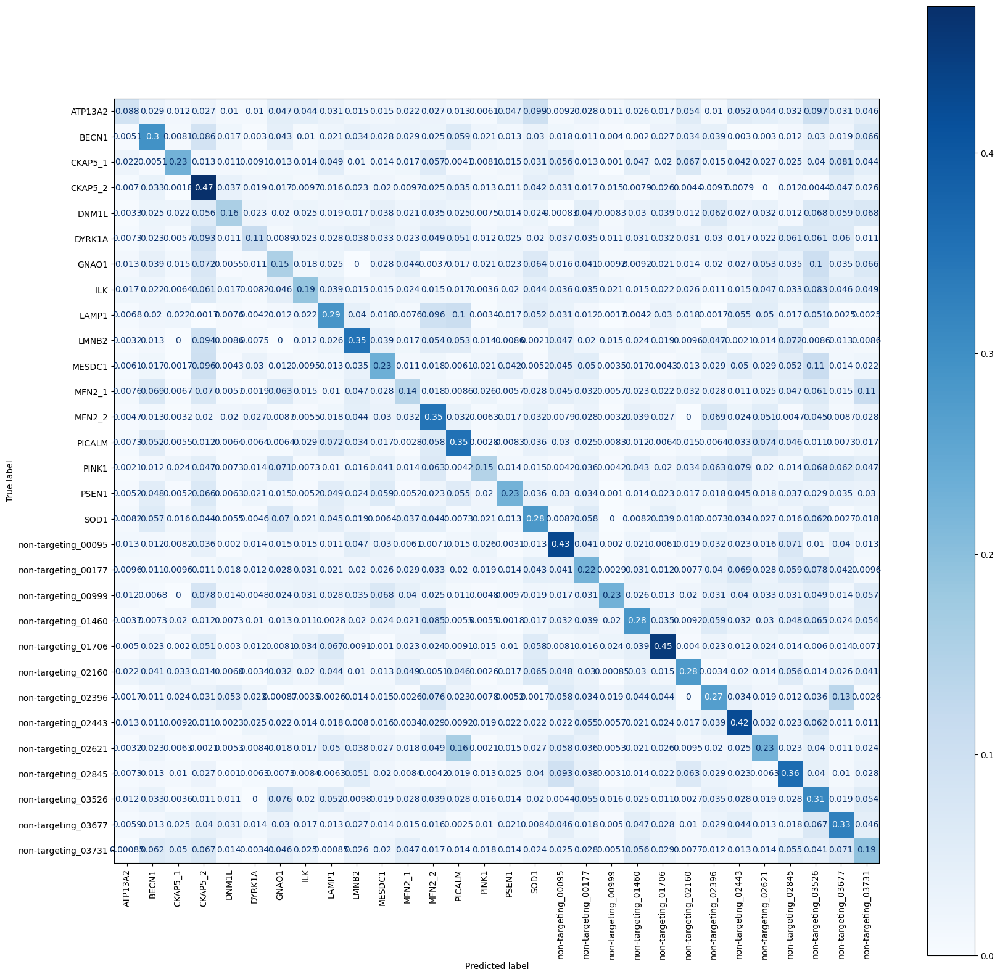

In [28]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(20,20))
conf_mtx = confusion_matrix(y_true = ref, y_pred = pred, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:len(d)])
vis.plot(ax=ax, cmap='Blues', xticks_rotation=90)
vis.im_.set_clim(0, 1)

# plate 1 single cells - 30 epochs base VIT

In [22]:
pred = []
ref = []
for i in plate1['train']:
    image = i['image']
    # image = image.to('CUDA')
    # encoding = i['pixel_values']
    # prepare image for the model
    encoding = image_processor(image.convert("RGB"), return_tensors="pt").to('cuda')
    # print(encoding.pixel_values.shape)
    # forward pass
    with torch.no_grad():
        # outputs = model.cpu()(**encoding)
        outputs = model.to('cuda')(**encoding)
        logits = outputs.logits
    # print(model.config.id2label[logits.argmax(-1).item()])
    pred.append(logits.argmax(-1).item())
    ref.append(i['label'])
    if len(pred)%20000 == 0:
        print(str(len(pred)) + ' - ' + str(len(pred)/214630.0) + '%')
# print('accuracy: ', str(pred.count(d_rev[tm])/len(pred)))
from sklearn.metrics import classification_report
print(classification_report(numpy.array(ref), numpy.array(pred)))



## testing plate2 model on entire plate1:

20000 - 0.09318361831989937%
40000 - 0.18636723663979873%
60000 - 0.27955085495969806%
80000 - 0.37273447327959747%
100000 - 0.4659180915994968%
120000 - 0.5591017099193961%
140000 - 0.6522853282392955%
160000 - 0.7454689465591949%
180000 - 0.8386525648790942%
200000 - 0.9318361831989936%
              precision    recall  f1-score   support

           0       0.03      0.02      0.02      6486
           1       0.05      0.02      0.03      6669
           2       0.05      0.02      0.03      6428
           3       0.05      0.01      0.02      7465
           4       0.04      0.08      0.06      7740
           5       0.03      0.04      0.03      7980
           6       0.04      0.04      0.04      7464
           7       0.06      0.06      0.06      7218
           8       0.05      0.06      0.05      7571
           9       0.08      0.16      0.11      6384
          10       0.03      0.01      0.02      7472
          11       0.06      0.03      0.04      7164
       

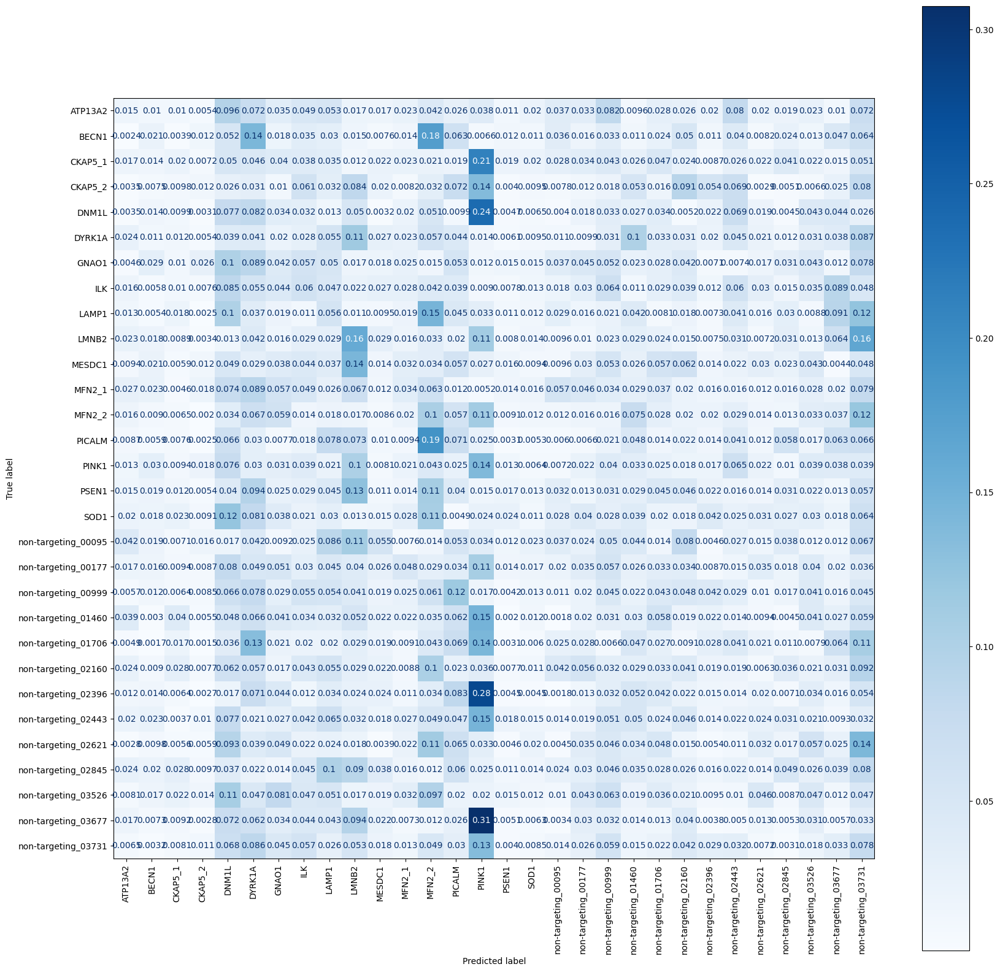

In [23]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(20,20))
conf_mtx = confusion_matrix(y_true = ref, y_pred = pred, normalize='true')
vis = ConfusionMatrixDisplay(confusion_matrix=conf_mtx, display_labels=list(d.values())[:len(d)])
vis.plot(ax=ax, cmap='Blues', xticks_rotation=90)
# vis.im_.set_clim(0, 1)

# testing plate2 model (300 epoch dinoV2) with entire plate1:

### entire plate2 model tested on plate1 trained model:

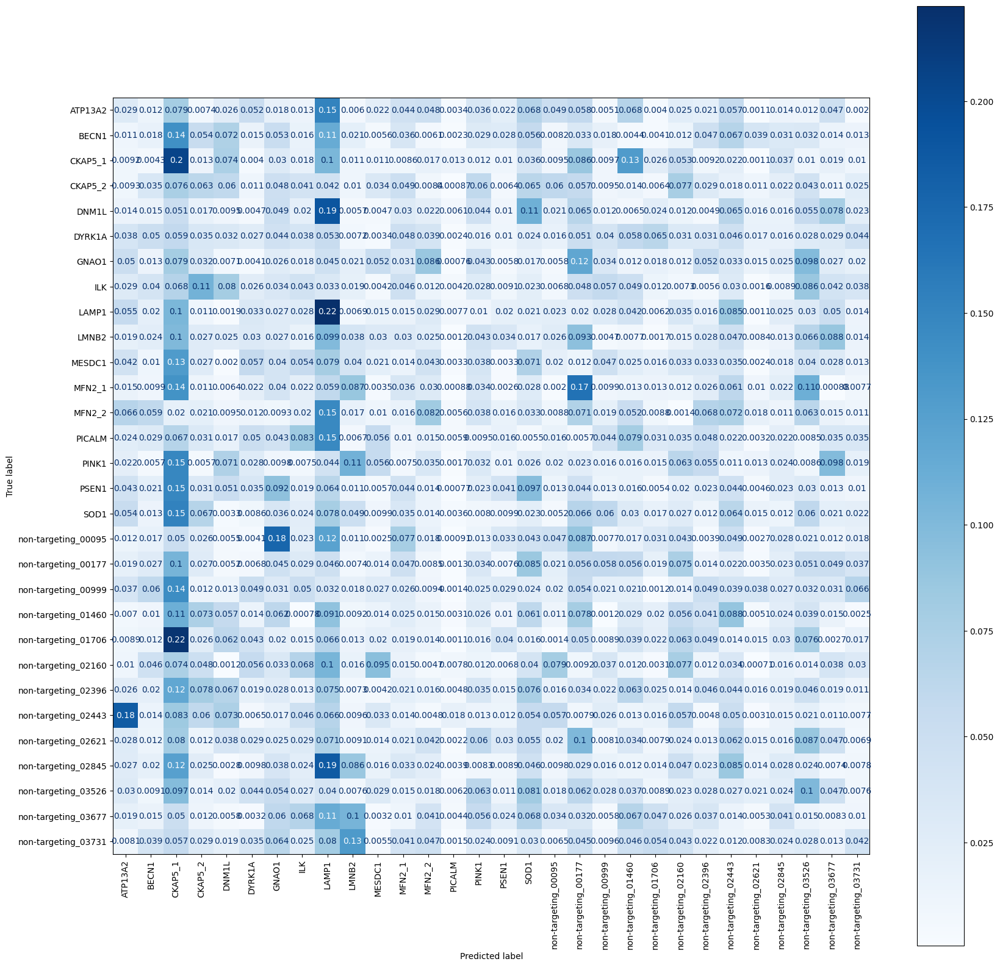

# DinoBloom

In [9]:
# DinoBloom:
# https://github.com/marrlab/DinoBloom
# https://colab.research.google.com/drive/1fjArdu28G5_C9Hq2Qe08bSJGu2Bk2rni#scrollTo=v3hwlw29zM7T

!wget "https://zenodo.org/records/10908163/files/DinoBloom-S.pth?download=1" -O dinobloom-s.pth

--2024-10-01 10:29:43--  https://zenodo.org/records/10908163/files/DinoBloom-S.pth?download=1
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.184.103.159, 188.185.79.172
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 265416526 (253M) [application/octet-stream]
Saving to: ‘dinobloom-s.pth’

dinobloom-s.pth     100%[===================>] 253.12M   501KB/s    in 4m 32s  

2024-10-01 10:34:16 (953 KB/s) - ‘dinobloom-s.pth’ saved [265416526/265416526]



In [11]:
# !git clone https://github.com/zxaoyou/segmentation_WBC.git

In [2]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# PCA for feature inferred
from sklearn.decomposition import PCA
from skimage.filters import threshold_otsu
import os
import random
from glob import glob

In [3]:
embed_sizes={"dinov2_vits14": 384,
        "dinov2_vitb14": 768,
        "dinov2_vitl14": 1024,
        "dinov2_vitg14": 1536}

IMAGENET_DEFAULT_MEAN = (0.485, 0.456, 0.406)
IMAGENET_DEFAULT_STD = (0.229, 0.224, 0.225)

patch_num_h=16
patch_num_w=16
img_size=224
eval_model="dinov2_vits14"

In [4]:
def get_dino_bloom(modelpath="dinobloom-s.pth", modelname="dinov2_vits14"):
    # load the original DINOv2 model with the correct architecture and parameters.
    model=torch.hub.load('facebookresearch/dinov2', modelname)
    # load finetuned weights
    pretrained = torch.load(modelpath, map_location=torch.device('cpu'))
    # make correct state dict for loading
    new_state_dict = {}
    for key, value in pretrained['teacher'].items():
        if 'dino_head' in key or "ibot_head" in key:
            pass
        else:
            new_key = key.replace('backbone.', '')
            new_state_dict[new_key] = value

    #corresponds to 224x224 image. patch size=14x14 => 16*16 patches
    pos_embed = nn.Parameter(torch.zeros(1, 257, embed_sizes["dinov2_vits14"]))
    model.pos_embed = pos_embed

    model.load_state_dict(new_state_dict, strict=True)
    return model

model=get_dino_bloom()

Using cache found in /home/ymoshfegh/.cache/torch/hub/facebookresearch_dinov2_main


In [15]:
model

DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x NestedTensorBlock(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (n

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),])

In [92]:
ls processed/plate6/tf_cells/

ATP13A2/  LAMP1/                non-targeting_01460/  non-targeting_03677/
BECN1/    LMNB2/                non-targeting_01706/  non-targeting_03731/
CKAP5_1/  MESDC1/               non-targeting_02160/  PICALM/
CKAP5_2/  MFN2_1/               non-targeting_02396/  PINK1/
DNM1L/    MFN2_2/               non-targeting_02443/  PSEN1/
DYRK1A/   non-targeting_00095/  non-targeting_02621/  SOD1/
GNAO1/    non-targeting_00177/  non-targeting_02845/
ILK/      non-targeting_00999/  non-targeting_03526/


In [6]:
paths=np.random.choice(list(Path("processed/plate6/tf_cells/MFN2_2/").glob("*.tif")), 4)
# paths=np.random.choice(list(Path("processed/plate6/cells/MFN2/").glob("*.npy")), 4)


images_for_plotting = [Image.open(img_path).convert('RGB').resize((img_size, img_size)) for img_path in paths]
# images_for_plotting = [numpy.load(img_path).convert('RGB').resize((img_size, img_size)) for img_path in paths]

if torch.cuda.is_available():
  model.cuda()
  imgs_tensor = torch.stack([transform(Image.open(img_path).convert('RGB').resize((img_size,img_size))).cuda() for img_path in paths])
  # imgs_tensor = torch.stack([transform(numpy.load(img_path).convert('RGB').resize((img_size,img_size))).cuda() for img_path in paths])
    
else:
  imgs_tensor = torch.stack([transform(Image.open(img_path).convert('RGB').resize((img_size,img_size)))for img_path in paths])

with torch.no_grad():
    # Ensure the input tensor is on GPU by calling .cuda() on it
    features_dict = model.forward_features(imgs_tensor)
    features = features_dict['x_norm_patchtokens']

features = features.reshape(len(paths) * patch_num_h*patch_num_w, embed_sizes[eval_model]).cpu().numpy()
pca = PCA(n_components=3)
pca.fit(features)
pca_features = pca.transform(features)


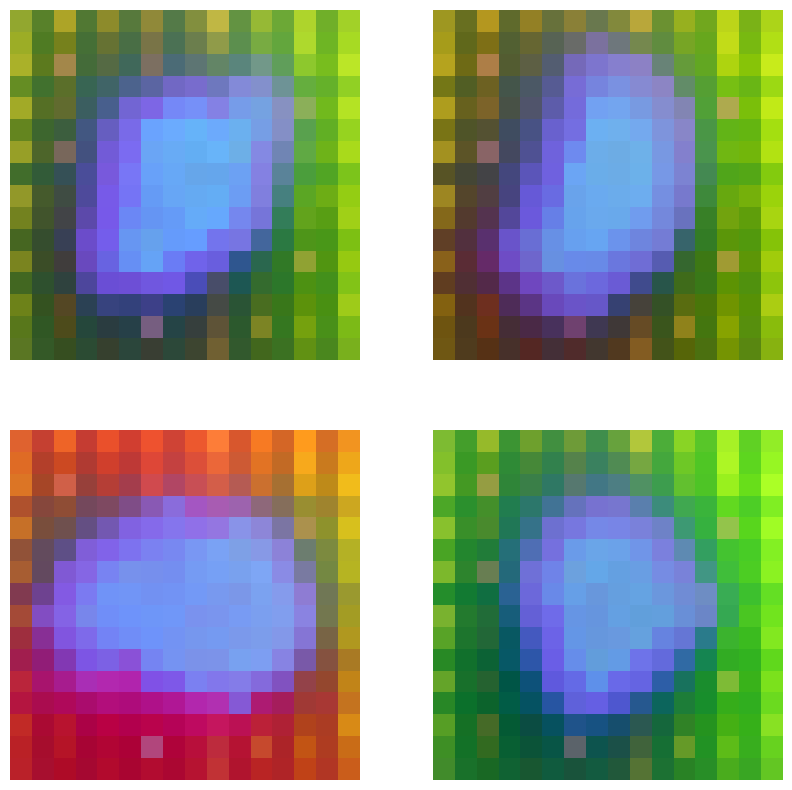

In [7]:
for i in range(3):
    pca_features[:, i] = (pca_features[:, i] - pca_features[:, i].min()) / (pca_features[:, i].max() - pca_features[:, i].min())

pca_features_rgb = pca_features.copy()
pca_features_rgb = pca_features_rgb.reshape(len(paths), patch_num_h, patch_num_w, 3)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    #print(Path(images_for_plotting[i]).stem)
    ax.imshow(pca_features_rgb[i][..., ::-1])
    ax.axis('off')  # Remove axis
# plt.savefig('features.png')
plt.show()
plt.close()

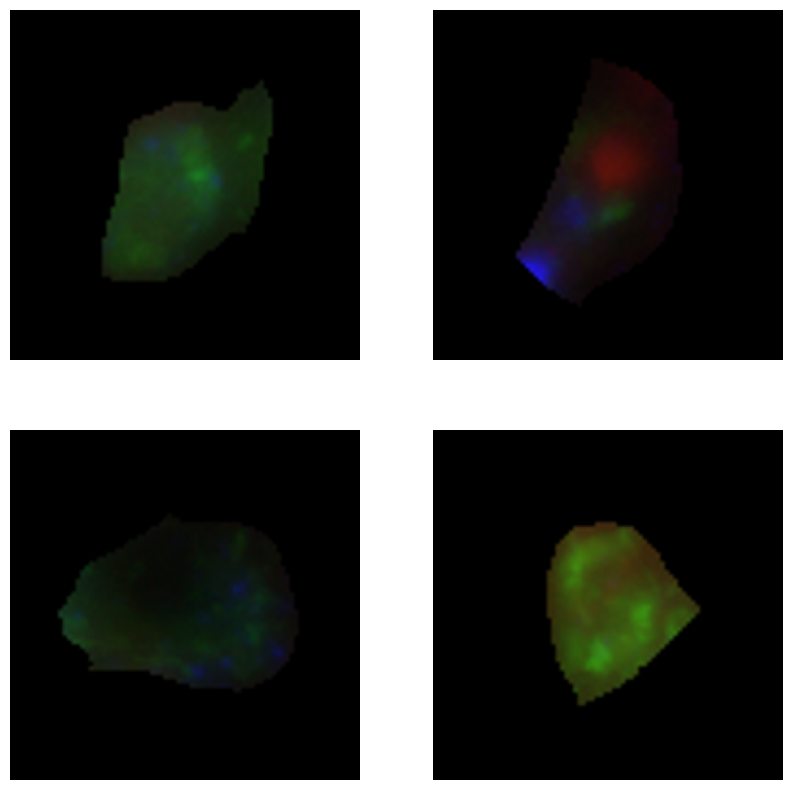

In [8]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    #print(Path(images_for_plotting[i]).stem)
    ax.imshow(images_for_plotting[i])
    ax.axis('off')  # Remove axis